<a href="https://colab.research.google.com/github/deokwoo-han/abc/blob/master/10_22_1_andre.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## ThinkDSP

This notebook contains solutions to exercises in Chapter 1: Sounds and Signals

Copyright 2015 Allen Downey

License: [Creative Commons Attribution 4.0 International](http://creativecommons.org/licenses/by/4.0/)

https://github.com/AllenDowney/ThinkDSP

In [ ]:
!pip install thinkx

### https://pypi.org/project/thinkx/

In [ ]:
from __future__ import print_function, division

%matplotlib inline

import thinkdsp
import thinkplot

import warnings
warnings.filterwarnings('ignore')

from IPython.html.widgets import interact, fixed
from IPython.display import display

### Exercise

Go to http://freesound.org and download a sound sample that
includes music, speech, or other sounds that have a well-defined pitch.
Select a roughly half-second segment where the pitch is
constant.  Compute and plot the spectrum of the segment you selected.
What connection can you make between the timbre of the sound and the
harmonic structure you see in the spectrum?

Use `high_pass`, `low_pass`, and `band_stop` to
filter out some of the harmonics.  Then convert the spectrum back
to a wave and listen to it.  How does the sound relate to the
changes you made in the spectrum?

### Solution

I chose this recording (or synthesis?) of a trumpet section http://www.freesound.org/people/Dublie/sounds/170255/

As always, thanks to the people who contributed these recordings!

In [ ]:
wave = thinkdsp.read_wave("./maria-callas-92sec.wav")
wave.normalize()
wave.make_audio()

Here's what the whole wave looks like:

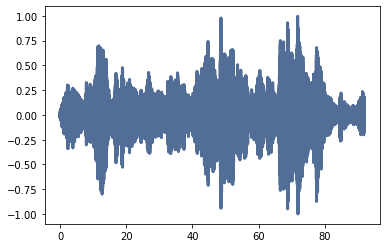

In [ ]:
wave.plot() #시간의 축으로 보여줌
#마리아는 큰 변화가 있음

By trial and error, I selected a segment with a constant pitch (although I believe it is a chord played by at least two horns).

In [ ]:
segment = wave.segment(start=65, duration=10) #15->10 58, 10 고음 하이 프리퀀시
segment.make_audio()#15초로 자름

Here's what the segment looks like:


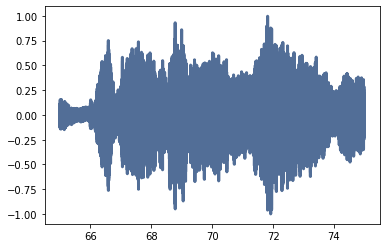

In [ ]:
segment.plot() #위에서 설정한 것을 증폭시킴

And here's an even shorter segment so you can see the waveform:

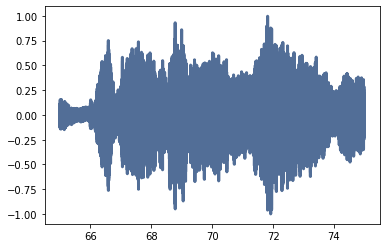

In [ ]:
#segment.segment(start=1.1, duration=0.005).plot()
segment.segment(start=65, duration=10).plot()

Here's what the spectrum looks like:

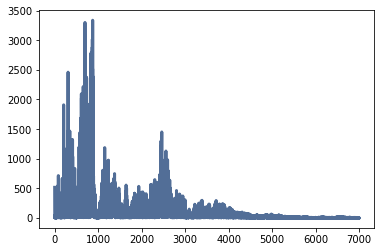

In [ ]:
spectrum = segment.make_spectrum()#프리퀀시 도메인으로 바꾸기
spectrum.plot(high=7000)#프리퀀시가 시간의 축과 완전히 달라짐

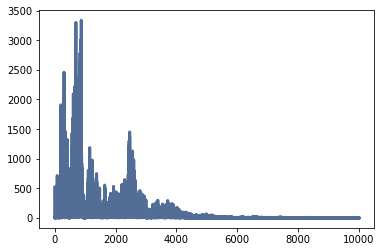

In [ ]:
spectrum.plot(high=10000)#만 시그널 만 이하로 잘라버림
#마스크를 쓰면 하이 프리퀀시가 다 짤려서 로우 패스 필터가 되어 로우 프리퀀시만 남음

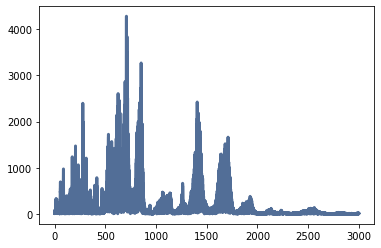

In [ ]:
spectrum.plot(high=3000)#로우 패스 필터

It has lots of frequency components.  Let's zoom in on the fundamental and dominant frequencies:

In [ ]:
spectrum.peaks()[:30] #어떤게 프리퀀시고 어떤게 빈도 수인가?
#피크가 빈도수, 위에서 가장 높은 곳, 주파수가 얼마인가? 350, 두번째는 845

[(4486.6582893136165, 351.6),
 (4414.302652321747, 845.2),
 (4137.325478821614, 798.9000000000001),
 (3813.8619311742787, 845.0),
 (3730.2973882437454, 797.7),
 (3662.578592273423, 797.8000000000001),
 (3649.2368393347197, 845.5),
 (3467.7279695319576, 797.9000000000001),
 (3459.5964195364954, 798.2),
 (3448.379625408908, 799.2),
 (3425.7722254552477, 778.2),
 (3401.6899292107746, 845.3000000000001),
 (3350.7051755984007, 798.1),
 (3345.5145612940937, 351.90000000000003),
 (3286.3661337777216, 796.3000000000001),
 (3185.988146328431, 799.0),
 (3127.6163981910477, 845.1),
 (3013.5806996227757, 798.3000000000001),
 (2939.780925205622, 798.5),
 (2932.7448675417413, 776.4000000000001),
 (2930.136677654705, 798.4000000000001),
 (2892.6024245917256, 802.3000000000001),
 (2890.3562847771814, 798.8000000000001),
 (2885.763651121085, 278.40000000000003),
 (2842.430550156762, 351.3),
 (2830.5237340936433, 845.4000000000001),
 (2814.969389901122, 797.6),
 (2808.1432498769336, 798.7),
 (2764.08103

In [ ]:
#spectrum.peaks()[:-1] 전부, 너무 김

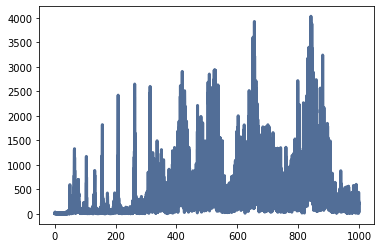

In [ ]:
spectrum = segment.make_spectrum()
spectrum.plot(high=1000)

`peaks` prints the highest points in the spectrum and their frequencies, in descending order:

The dominant peak is at 870 Hz.  It's not easy to dig out the fundamental, but with peaks at 507, 347, and 253 Hz, we can infer a fundamental at roughly 85 Hz, with harmonics at 170, 255, 340, 425, and 510 Hz.

85 Hz is close to F2 at 87 Hz.  The pitch we perceive is usually the fundamental, even when it is not dominant.  When you listen to this segment, what pitch(es) do you perceive?

Next we can filter out the high frequencies:

In [ ]:
spectrum.low_pass(3000)#2000#계속 잘려서 다시 읽어야 함

And here's what it sounds like:

In [ ]:
spectrum.make_wave().make_audio()#너무 낮아짐, 옆 방에서 나는 소리처럼
#3000으로 자르면 음악소리가 전화 소리로 전락
#소리를 프리퀀시 도메인으로 갖다 넣는 것이 어떤 의미인지...

The following interaction allows you to select a segment and apply different filters.  If you set the cutoff to 3400 Hz, you can simulate what the sample would sound like over an old (not digital) phone line.

In [ ]:
def filter_wave(wave, start, duration, cutoff): #아래 위로 컷오프
    """Selects a segment from the wave and filters it.
    
    Plots the spectrum and displays an Audio widget.
    
    wave: Wave object
    start: time in s
    duration: time in s
    cutoff: frequency in Hz
    """
    segment = wave.segment(start, duration)
    spectrum = segment.make_spectrum()

    spectrum.plot(high=5000, color='0.7')
    spectrum.low_pass(cutoff)
    spectrum.plot(high=5000, color='#045a8d')
    thinkplot.config(xlabel='Frequency (Hz)')
    
    audio = spectrum.make_wave().make_audio()
    display(audio)

In [ ]:
interact(filter_wave, wave=fixed(wave), 
         start=(0, 5, 0.1), duration=(0, 5, 0.1), cutoff=(0, 3000, 100));
         #컷오프 시점도 조절할 수 있음, 특정 영역만 갖다가 소리를 보내 줄 수 있는

interactive(children=(FloatSlider(value=2.0, description='start', max=5.0), FloatSlider(value=2.0, description…

### Exercise

Synthesize a compound signal by creating SinSignal and CosSignal
objects and adding them up.  Evaluate the signal to get a Wave,
and listen to it.  Compute its Spectrum and plot it.
What happens if you add frequency
components that are not multiples of the fundamental?

### Solution

Here are some arbitrary components I chose.  It makes an interesting waveform!

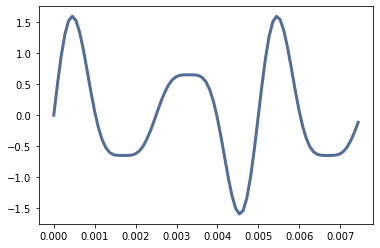

In [ ]:
signal = (thinkdsp.SinSignal(freq=400, amp=1.0) +
          thinkdsp.SinSignal(freq=600, amp=0.5) +
          thinkdsp.SinSignal(freq=800, amp=0.25))
signal.plot()

We can use the signal to make a wave:

In [ ]:
wave2 = signal.make_wave(duration=1)
wave2.apodize()

And here's what it sounds like:

In [ ]:
wave2.make_audio()

The components are all multiples of 200 Hz, so they make a coherent sounding tone.

Here's what the spectrum looks like:

In [ ]:
spectrum = wave2.make_spectrum()
spectrum.plot(high=2000)

If we add a component that is not a multiple of 200 Hz, we hear it as a distinct pitch.

In [ ]:
signal += thinkdsp.SinSignal(freq=450)
signal.make_wave().make_audio()

### Exercise

Write a function called `stretch` that takes a Wave and a stretch factor and speeds up or slows down the wave by modifying `ts` and `framerate`.  Hint: it should only take two lines of code.

### Solution

I'll use the trumpet example again:

wave3 = thinkdsp.read_wave('170255__dublie__trumpet.wav')
wave3.normalize()
wave3.make_audio()

Here's my implementation of `stretch`

def stretch(wave, factor):
    wave.ts *= factor
    wave.framerate /= factor

And here's what it sounds like if we speed it up by a factor of 2.

stretch(wave3, 0.5)
wave3.make_audio()

Here's what it looks like (to confirm that the `ts` got updated correctly).

wave3.plot()

I think it sounds better speeded up.  In fact, I wonder if we are playing the original at the right speed.